# Regression Predict Student Solution

© Explore Data Science Academy

---
### Honour Code

I {**YOUR NAME, YOUR SURNAME**}, confirm - by submitting this document - that the solutions in this notebook are a result of my own work and that I abide by the [EDSA honour code](https://drive.google.com/file/d/1QDCjGZJ8-FmJE3bZdIQNwnJyQKPhHZBn/view?usp=sharing).

Non-compliance with the honour code constitutes a material breach of contract.

### Predict Overview: Spain Electricity Shortfall Challenge

The government of Spain is considering an expansion of it's renewable energy resource infrastructure investments. As such, they require information on the trends and patterns of the countries renewable sources and fossil fuel energy generation. Your company has been awarded the contract to:

- 1. analyse the supplied data;
- 2. identify potential errors in the data and clean the existing data set;
- 3. determine if additional features can be added to enrich the data set;
- 4. build a model that is capable of forecasting the three hourly demand shortfalls;
- 5. evaluate the accuracy of the best machine learning model;
- 6. determine what features were most important in the model’s prediction decision, and
- 7. explain the inner working of the model to a non-technical audience.

Formally the problem statement was given to you, the senior data scientist, by your manager via email reads as follow:

> In this project you are tasked to model the shortfall between the energy generated by means of fossil fuels and various renewable sources - for the country of Spain. The daily shortfall, which will be referred to as the target variable, will be modelled as a function of various city-specific weather features such as `pressure`, `wind speed`, `humidity`, etc. As with all data science projects, the provided features are rarely adequate predictors of the target variable. As such, you are required to perform feature engineering to ensure that you will be able to accurately model Spain's three hourly shortfalls.
 
On top of this, she has provided you with a starter notebook containing vague explanations of what the main outcomes are. 

<a id="cont"></a>

## Table of Contents

<a href=#one>1. Importing Packages</a>

<a href=#two>2. Loading Data</a>

<a href=#three>3. Exploratory Data Analysis (EDA)</a>

<a href=#four>4. Data Engineering</a>

<a href=#five>5. Modeling</a>

<a href=#six>6. Model Performance</a>

<a href=#seven>7. Model Explanations</a>

 <a id="one"></a>
## 1. Importing Packages
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Importing Packages ⚡ |
| :--------------------------- |
| In this section you are required to import, and briefly discuss, the libraries that will be used throughout your analysis and modelling. |

---

In [569]:
# Libraries for data loading, data manipulation and data visulisation
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')
# Libraries for data preparation and model building
#import *
%matplotlib notebook
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D

from statsmodels.graphics.correlation import plot_corr
from statsmodels.formula.api import ols
from scipy.stats import pearsonr
import statsmodels.formula.api as sm


# Setting global constants to ensure notebook results are reproducible
#PARAMETER_CONSTANT = ###

<a id="two"></a>
## 2. Loading the Data
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Loading the data ⚡ |
| :--------------------------- |
| In this section you are required to load the data from the `df_train` file into a DataFrame. |

---

In [684]:
# load the data
df = pd.read_csv('/Users/admin/Documents/Data Science/Explore/R/Advanced-Regression-Starter-Data/df_train.csv')

In [571]:
df.head()

,Unnamed: 0,time,Madrid_wind_speed,Valencia_wind_deg,Bilbao_rain_1h,Valencia_wind_speed,Seville_humidity,Madrid_humidity,Bilbao_clouds_all,Bilbao_wind_speed,...,Madrid_temp_max,Barcelona_temp,Bilbao_temp_min,Bilbao_temp,Barcelona_temp_min,Bilbao_temp_max,Seville_temp_min,Madrid_temp,Madrid_temp_min,load_shortfall_3h
0,0,2015-01-01 03:00:00,0.666667,level_5,0.0,0.666667,74.333333,64.000000,0.0,1.000000,...,265.938000,281.013000,269.338615,269.338615,281.013000,269.338615,274.254667,265.938000,265.938000,6715.666667
1,1,2015-01-01 06:00:00,0.333333,level_10,0.0,1.666667,78.333333,64.666667,0.0,1.000000,...,266.386667,280.561667,270.376000,270.376000,280.561667,270.376000,274.945000,266.386667,266.386667,4171.666667
2,2,2015-01-01 09:00:00,1.000000,level_9,0.0,1.000000,71.333333,64.333333,0.0,1.000000,...,272.708667,281.583667,275.027229,275.027229,281.583667,275.027229,278.792000,272.708667,272.708667,4274.666667
3,3,2015-01-01 12:00:00,1.000000,level_8,0.0,1.000000,65.333333,56.333333,0.0,1.000000,...,281.895219,283.434104,281.135063,281.135063,283.434104,281.135063,285.394000,281.895219,281.895219,5075.666667
4,4,2015-01-01 15:00:00,1.000000,level_7,0.0,1.000000,59.000000,57.000000,2.0,0.333333,...,280.678437,284.213167,282.252063,282.252063,284.213167,282.252063,285.513719,280.678437,280.678437,6620.666667


<a id="three"></a>
## 3. Exploratory Data Analysis (EDA)
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Exploratory data analysis ⚡ |
| :--------------------------- |
| In this section, you are required to perform an in-depth analysis of all the variables in the DataFrame. |

---


In [464]:
# look at data statistics

In [572]:
df.shape

(8763, 49)

The train data has 8763 rows and 49 columns

In [689]:
#look at the train data info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8763 entries, 0 to 8762
Data columns (total 49 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Unnamed: 0            8763 non-null   int64  
 1   time                  8763 non-null   object 
 2   Madrid_wind_speed     8763 non-null   float64
 3   Valencia_wind_deg     8763 non-null   object 
 4   Bilbao_rain_1h        8763 non-null   float64
 5   Valencia_wind_speed   8763 non-null   float64
 6   Seville_humidity      8763 non-null   float64
 7   Madrid_humidity       8763 non-null   float64
 8   Bilbao_clouds_all     8763 non-null   float64
 9   Bilbao_wind_speed     8763 non-null   float64
 10  Seville_clouds_all    8763 non-null   float64
 11  Bilbao_wind_deg       8763 non-null   float64
 12  Barcelona_wind_speed  8763 non-null   float64
 13  Barcelona_wind_deg    8763 non-null   float64
 14  Madrid_clouds_all     8763 non-null   float64
 15  Seville_wind_speed   

The train consists of 47 numerical datatypes and 3 categorical datatypes. it also revealed that Valencia_pressure has some null values.

In [574]:
#To confirm the number of null values
df.isnull().sum()

Unnamed: 0                 0
time                       0
Madrid_wind_speed          0
Valencia_wind_deg          0
Bilbao_rain_1h             0
Valencia_wind_speed        0
Seville_humidity           0
Madrid_humidity            0
Bilbao_clouds_all          0
Bilbao_wind_speed          0
Seville_clouds_all         0
Bilbao_wind_deg            0
Barcelona_wind_speed       0
Barcelona_wind_deg         0
Madrid_clouds_all          0
Seville_wind_speed         0
Barcelona_rain_1h          0
Seville_pressure           0
Seville_rain_1h            0
Bilbao_snow_3h             0
Barcelona_pressure         0
Seville_rain_3h            0
Madrid_rain_1h             0
Barcelona_rain_3h          0
Valencia_snow_3h           0
Madrid_weather_id          0
Barcelona_weather_id       0
Bilbao_pressure            0
Seville_weather_id         0
Valencia_pressure       2068
Seville_temp_max           0
Madrid_pressure            0
Valencia_temp_max          0
Valencia_temp              0
Bilbao_weather

Valencia_pressure has a total of 2068 null values.

In [575]:
# Summary statistics
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Unnamed: 0,8763.0,4381.000000,2529.804538,0.000000,2190.500000,4381.000000,6571.500000,8.762000e+03
Madrid_wind_speed,8763.0,2.425729,1.850371,0.000000,1.000000,2.000000,3.333333,1.300000e+01
Bilbao_rain_1h,8763.0,0.135753,0.374901,0.000000,0.000000,0.000000,0.100000,3.000000e+00
Valencia_wind_speed,8763.0,2.586272,2.411190,0.000000,1.000000,1.666667,3.666667,5.200000e+01
Seville_humidity,8763.0,62.658793,22.621226,8.333333,44.333333,65.666667,82.000000,1.000000e+02
Madrid_humidity,8763.0,57.414717,24.335396,6.333333,36.333333,58.000000,78.666667,1.000000e+02
Bilbao_clouds_all,8763.0,43.469132,32.551044,0.000000,10.000000,45.000000,75.000000,1.000000e+02
Bilbao_wind_speed,8763.0,1.850356,1.695888,0.000000,0.666667,1.000000,2.666667,1.266667e+01
Seville_clouds_all,8763.0,13.714748,24.272482,0.000000,0.000000,0.000000,20.000000,9.733333e+01
Bilbao_wind_deg,8763.0,158.957511,102.056299,0.000000,73.333333,147.000000,234.000000,3.593333e+02


In [576]:
#Data distribution
df.skew()

Unnamed: 0               0.000000
Madrid_wind_speed        1.441144
Bilbao_rain_1h           5.222802
Valencia_wind_speed      3.499637
Seville_humidity        -0.310175
Madrid_humidity         -0.057378
Bilbao_clouds_all       -0.053085
Bilbao_wind_speed        1.716914
Seville_clouds_all       1.814452
Bilbao_wind_deg          0.226927
Barcelona_wind_speed     1.057331
Barcelona_wind_deg      -0.180001
Madrid_clouds_all        1.246745
Seville_wind_speed       1.151006
Barcelona_rain_1h        8.726988
Seville_rain_1h          8.067341
Bilbao_snow_3h          26.177568
Barcelona_pressure      57.979664
Seville_rain_3h         19.342574
Madrid_rain_1h           7.074308
Barcelona_rain_3h       12.696605
Valencia_snow_3h        63.298084
Madrid_weather_id       -3.107722
Barcelona_weather_id    -2.584011
Bilbao_pressure         -0.999642
Seville_weather_id      -3.275574
Valencia_pressure       -1.705162
Seville_temp_max        -0.033931
Madrid_pressure         -1.850768
Valencia_temp_

In [577]:
# determine present of outliers
df.kurtosis()

Unnamed: 0                -1.200000
Madrid_wind_speed          2.036462
Bilbao_rain_1h            32.904656
Valencia_wind_speed       35.645426
Seville_humidity          -1.017983
Madrid_humidity           -1.167537
Bilbao_clouds_all         -1.533417
Bilbao_wind_speed          3.631565
Seville_clouds_all         2.155921
Bilbao_wind_deg           -1.083530
Barcelona_wind_speed       1.493635
Barcelona_wind_deg        -0.959160
Madrid_clouds_all          0.142079
Seville_wind_speed         1.398580
Barcelona_rain_1h        101.578931
Seville_rain_1h           93.840746
Bilbao_snow_3h           806.128471
Barcelona_pressure      3687.564230
Seville_rain_3h          413.136592
Madrid_rain_1h            76.584491
Barcelona_rain_3h        187.800460
Valencia_snow_3h        4089.323165
Madrid_weather_id          9.259047
Barcelona_weather_id       5.701882
Bilbao_pressure            1.825323
Seville_weather_id        10.710308
Valencia_pressure          2.211823
Seville_temp_max          -0

The data has some outliers. Columns with kurtosis > 3 are outliers.

In [471]:
# plot relevant feature interactions

In [578]:
features = []
for i in df.columns:
    features.append(df[i].name)

<IPython.core.display.Javascript object>


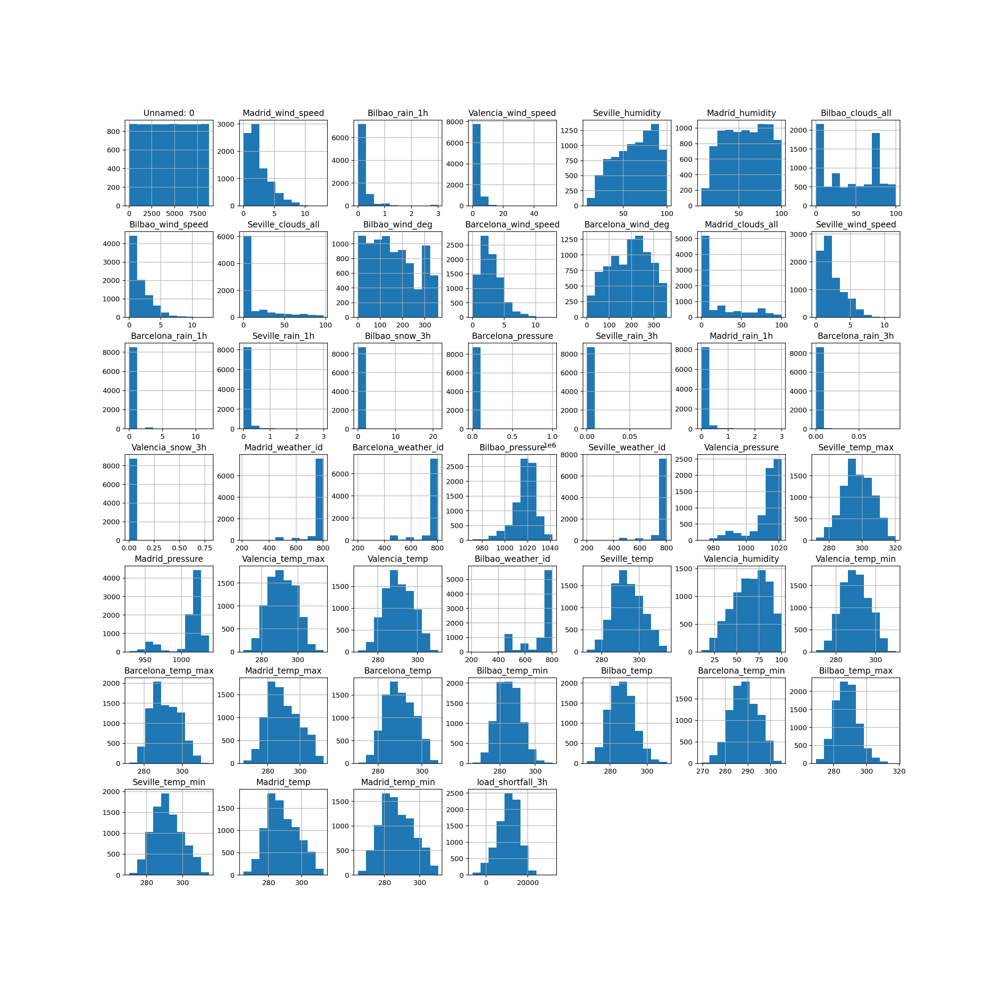

array([[<AxesSubplot:title={'center':'Unnamed: 0'}>,
        <AxesSubplot:title={'center':'Madrid_wind_speed'}>,
        <AxesSubplot:title={'center':'Bilbao_rain_1h'}>,
        <AxesSubplot:title={'center':'Valencia_wind_speed'}>,
        <AxesSubplot:title={'center':'Seville_humidity'}>,
        <AxesSubplot:title={'center':'Madrid_humidity'}>,
        <AxesSubplot:title={'center':'Bilbao_clouds_all'}>],
       [<AxesSubplot:title={'center':'Bilbao_wind_speed'}>,
        <AxesSubplot:title={'center':'Seville_clouds_all'}>,
        <AxesSubplot:title={'center':'Bilbao_wind_deg'}>,
        <AxesSubplot:title={'center':'Barcelona_wind_speed'}>,
        <AxesSubplot:title={'center':'Barcelona_wind_deg'}>,
        <AxesSubplot:title={'center':'Madrid_clouds_all'}>,
        <AxesSubplot:title={'center':'Seville_wind_speed'}>],
       [<AxesSubplot:title={'center':'Barcelona_rain_1h'}>,
        <AxesSubplot:title={'center':'Seville_rain_1h'}>,
        <AxesSubplot:title={'center':'Bilbao_sn

In [579]:
df[features].hist(figsize=(20,20))

<IPython.core.display.Javascript object>


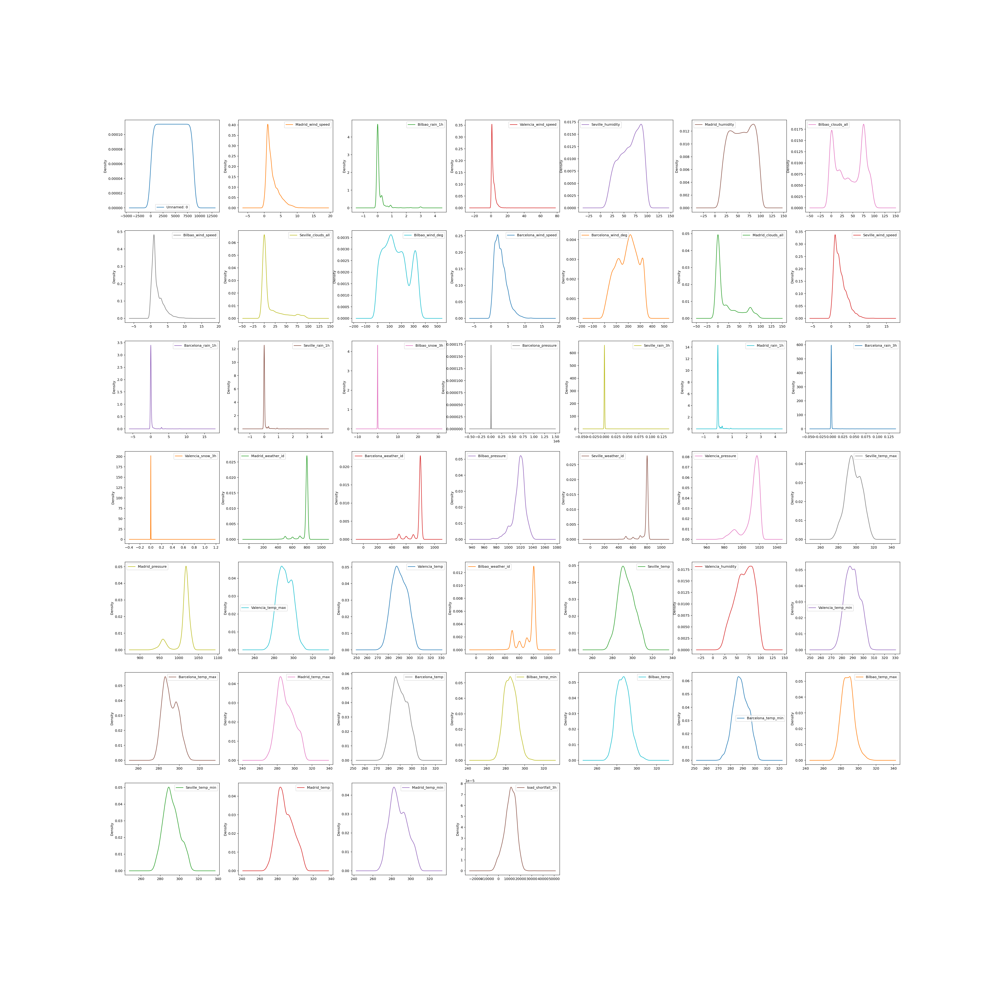

In [580]:
df[features].plot(kind='density', subplots=True, layout=(7, 7), sharex=False, figsize=(40, 40));

In [388]:
# evaluate correlation

In [581]:
df.corr()

,Unnamed: 0,Madrid_wind_speed,Bilbao_rain_1h,Valencia_wind_speed,Seville_humidity,Madrid_humidity,Bilbao_clouds_all,Bilbao_wind_speed,Seville_clouds_all,Bilbao_wind_deg,...,Madrid_temp_max,Barcelona_temp,Bilbao_temp_min,Bilbao_temp,Barcelona_temp_min,Bilbao_temp_max,Seville_temp_min,Madrid_temp,Madrid_temp_min,load_shortfall_3h
Unnamed: 0,1.000000,-0.109288,-0.249633,-0.090161,-0.079025,-0.103359,-0.068123,0.049197,-0.140583,-0.155738,...,0.093378,0.068078,0.028698,0.081799,0.103436,0.146216,0.037487,0.088439,0.085197,0.192612
Madrid_wind_speed,-0.109288,1.000000,0.259719,0.513092,-0.117892,-0.137092,0.244001,0.377854,0.191251,0.270950,...,0.091464,0.080133,0.077330,0.060467,0.089992,0.042114,0.110278,0.109572,0.098138,-0.150981
Bilbao_rain_1h,-0.249633,0.259719,1.000000,0.265864,0.069878,0.106765,0.370733,0.085398,0.081131,0.279350,...,-0.148397,-0.138901,-0.141269,-0.182494,-0.106593,-0.219871,-0.120575,-0.135927,-0.116431,-0.152510
Valencia_wind_speed,-0.090161,0.513092,0.265864,1.000000,-0.075227,-0.019388,0.210524,0.386478,0.163675,0.248643,...,-0.021970,-0.021456,-0.010166,-0.022676,0.001413,-0.033271,0.003618,-0.011982,-0.019742,-0.142791
Seville_humidity,-0.079025,-0.117892,0.069878,-0.075227,1.000000,0.799831,0.061680,-0.088180,0.399436,-0.087246,...,-0.708937,-0.617797,-0.605493,-0.604733,-0.595065,-0.583718,-0.784850,-0.717171,-0.688664,-0.167290
Madrid_humidity,-0.103359,-0.137092,0.106765,-0.019388,0.799831,1.000000,0.041878,-0.016808,0.374112,-0.069570,...,-0.803260,-0.684867,-0.635760,-0.634825,-0.636777,-0.611395,-0.769591,-0.802605,-0.759633,-0.150536
Bilbao_clouds_all,-0.068123,0.244001,0.370733,0.210524,0.061680,0.041878,1.000000,0.031915,0.046737,0.280154,...,-0.048491,-0.023171,-0.067731,-0.114118,-0.010804,-0.158014,-0.077417,-0.046686,-0.046189,-0.127293
Bilbao_wind_speed,0.049197,0.377854,0.085398,0.386478,-0.088180,-0.016808,0.031915,1.000000,0.127344,0.417534,...,0.025367,0.018967,0.107302,0.142435,0.023711,0.177123,0.055077,0.031245,0.021425,-0.081602
Seville_clouds_all,-0.140583,0.191251,0.081131,0.163675,0.399436,0.374112,0.046737,0.127344,1.000000,0.053482,...,-0.238895,-0.186463,-0.134249,-0.152393,-0.153412,-0.165567,-0.200453,-0.227094,-0.212758,-0.091804
Bilbao_wind_deg,-0.155738,0.270950,0.279350,0.248643,-0.087246,-0.069570,0.280154,0.417534,0.053482,1.000000,...,0.028535,0.068701,0.095047,0.065396,0.086482,0.031187,0.062663,0.044102,0.048397,-0.120800


<IPython.core.display.Javascript object>


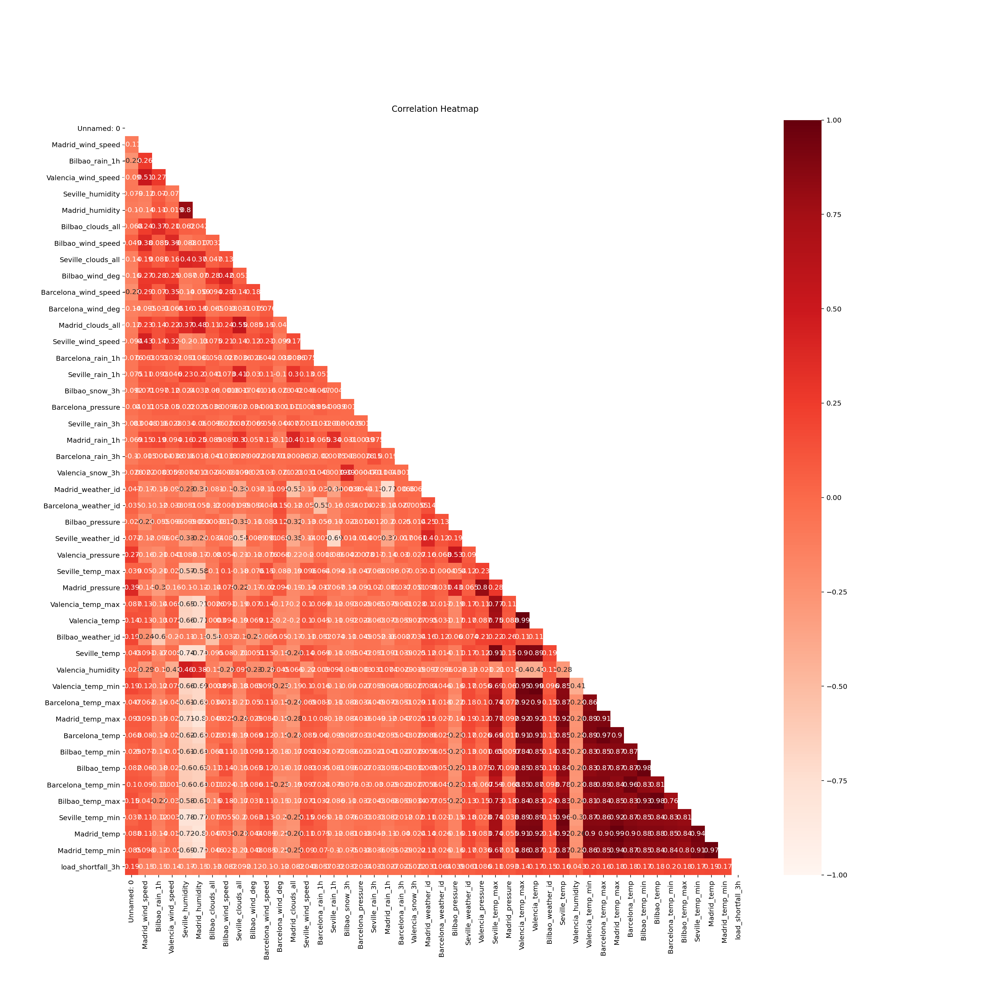

Text(0.5, 1.0, 'Correlation Heatmap')

In [583]:
plt.figure(figsize=(20, 20))
mask = np.triu(np.ones_like(df.corr(), dtype=np.bool))
heatmap = sns.heatmap(df.corr(), vmin=-1, mask = mask,vmax=1, annot=True,cmap = 'Reds')
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':12}, pad=12)

In [391]:
# have a look at feature distributions

<a id="four"></a>
## 4. Data Engineering
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Data engineering ⚡ |
| :--------------------------- |
| In this section you are required to: clean the dataset, and possibly create new features - as identified in the EDA phase. |

---

In [392]:
# remove missing values/ features

In [585]:
df.drop('Unnamed: 0', axis=1, inplace=True)

In [586]:
df.head()

,time,Madrid_wind_speed,Valencia_wind_deg,Bilbao_rain_1h,Valencia_wind_speed,Seville_humidity,Madrid_humidity,Bilbao_clouds_all,Bilbao_wind_speed,Seville_clouds_all,...,Madrid_temp_max,Barcelona_temp,Bilbao_temp_min,Bilbao_temp,Barcelona_temp_min,Bilbao_temp_max,Seville_temp_min,Madrid_temp,Madrid_temp_min,load_shortfall_3h
0,2015-01-01 03:00:00,0.666667,level_5,0.0,0.666667,74.333333,64.000000,0.0,1.000000,0.0,...,265.938000,281.013000,269.338615,269.338615,281.013000,269.338615,274.254667,265.938000,265.938000,6715.666667
1,2015-01-01 06:00:00,0.333333,level_10,0.0,1.666667,78.333333,64.666667,0.0,1.000000,0.0,...,266.386667,280.561667,270.376000,270.376000,280.561667,270.376000,274.945000,266.386667,266.386667,4171.666667
2,2015-01-01 09:00:00,1.000000,level_9,0.0,1.000000,71.333333,64.333333,0.0,1.000000,0.0,...,272.708667,281.583667,275.027229,275.027229,281.583667,275.027229,278.792000,272.708667,272.708667,4274.666667
3,2015-01-01 12:00:00,1.000000,level_8,0.0,1.000000,65.333333,56.333333,0.0,1.000000,0.0,...,281.895219,283.434104,281.135063,281.135063,283.434104,281.135063,285.394000,281.895219,281.895219,5075.666667
4,2015-01-01 15:00:00,1.000000,level_7,0.0,1.000000,59.000000,57.000000,2.0,0.333333,0.0,...,280.678437,284.213167,282.252063,282.252063,284.213167,282.252063,285.513719,280.678437,280.678437,6620.666667


In [587]:
df['Valencia_pressure'].fillna(value = df['Valencia_pressure'].median(),inplace= True)
df.isnull().any().sum()

0

In [480]:
# create new features

In [588]:
df1= df.copy()

In [482]:
# engineer existing features

In [592]:
#Dealing with outliers
def outliers(dataframe, column):
    Q1 = dataframe[column].quantile(0.25)
    Q3 = dataframe[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_boundary = Q1 - 1.5 * IQR
    upper_boundary = Q3 + 1.5 * IQR
    remove_out = dataframe.loc[(dataframe[column] >= lower_boundary) & (dataframe[column] <= upper_boundary)]
    return remove_out

In [593]:
Bilbao_rain_1h = outliers(df1, 'Bilbao_rain_1h')
Valencia_wind_speed = outliers(df1, 'Valencia_wind_speed')
Bilbao_wind_speed = outliers(df1, 'Bilbao_wind_speed')
Barcelona_rain_1h = outliers(df1, 'Barcelona_rain_1h')
Seville_rain_1h = outliers(df1, 'Seville_rain_1h')
Bilbao_snow_3h = outliers(df1, 'Bilbao_snow_3h')
Barcelona_pressure = outliers(df1, 'Barcelona_pressure')
Seville_rain_3h = outliers(df1, 'Seville_rain_3h')
Madrid_rain_1h = outliers(df1, 'Madrid_rain_1h')
Barcelona_rain_3h = outliers(df1, 'Barcelona_rain_3h')
Valencia_snow_3h = outliers(df1, 'Valencia_snow_3h')
Madrid_weather_id = outliers(df1, 'Madrid_weather_id')
Barcelona_weather_id = outliers(df1, 'Barcelona_weather_id')
Seville_weather_id = outliers(df1, 'Seville_weather_id')

In [594]:
bins = [0, 36, 72, 108, 144, 180, 216, 252, 288, 324, 360]
labels = ["level_1","level_2","level_3","level_4", "level_5","level_6","level_7","level_8","level_9","level_10"]
df1['Barcelona_wind_deg_cat'] = pd.cut(df1['Barcelona_wind_deg'], bins=bins, labels=labels, include_lowest=True)
cols = ['Barcelona_wind_deg_cat', 'Barcelona_wind_deg']
df1[cols]

,Barcelona_wind_deg_cat,Barcelona_wind_deg
0,level_2,42.666667
1,level_4,139.000000
2,level_10,326.000000
3,level_8,273.000000
4,level_8,260.000000
...,...,...
8758,level_3,83.666667
8759,level_6,213.333333
8760,level_8,256.666667
8761,level_7,250.000000


In [595]:
bins = [0, 36, 72, 108, 144, 180, 216, 252, 288, 324, 360]
labels = ["level_1","level_2","level_3","level_4", "level_5","level_6","level_7","level_8","level_9","level_10"]
df1['Bilbao_wind_deg_cat'] = pd.cut(df1['Bilbao_wind_deg'], bins=bins, labels=labels, include_lowest=True)
cols1 = ['Bilbao_wind_deg_cat', 'Bilbao_wind_deg']
df1[cols1]

,Bilbao_wind_deg_cat,Bilbao_wind_deg
0,level_7,223.333333
1,level_7,221.000000
2,level_6,214.333333
3,level_6,199.666667
4,level_6,185.000000
...,...,...
8758,level_7,226.666667
8759,level_7,220.000000
8760,level_8,283.333333
8761,level_7,220.000000


In [596]:
#diff = 
df1.Barcelona_pressure.max() 
interval = df1.Barcelona_pressure.max()/25
interval

40056.44

In [597]:
bins = [0, 40057, 80114, 120171, 160228, 200285, 240342, 280399, 320456, 360513, 400570, 440627, 480684, 520741, 560798, 600855, 640912, 680969, 721026, 761083, 801140, 841197, 881254, 921311, 961368, 1001425]
labels = ["sp1","sp2","sp3","sp4", "sp5","sp6","sp7","sp8","sp9","sp10","sp11","sp12","sp13","sp14","sp15","sp16","sp17","sp18","sp19","sp20","sp21","sp22","sp23","sp24","sp25",]
df1['Barcelona_pressure_cat'] = pd.cut(df1['Barcelona_pressure'], bins=bins, labels=labels, include_lowest=True)
cols3 = ['Barcelona_pressure_cat', 'Barcelona_pressure']
df1[cols3]

,Barcelona_pressure_cat,Barcelona_pressure
0,sp1,1036.333333
1,sp1,1037.333333
2,sp1,1038.000000
3,sp1,1037.000000
4,sp1,1035.000000
...,...,...
8758,sp1,1021.000000
8759,sp1,1019.000000
8760,sp1,1015.666667
8761,sp1,1015.000000


In [598]:
bins = [0, 40057, 80114, 120171, 160228, 200285, 240342, 280399, 320456, 360513, 400570, 440627, 480684, 520741, 560798, 600855, 640912, 680969, 721026, 761083, 801140, 841197, 881254, 921311, 961368, 1001425]
labels = ["sp1","sp2","sp3","sp4", "sp5","sp6","sp7","sp8","sp9","sp10","sp11","sp12","sp13","sp14","sp15","sp16","sp17","sp18","sp19","sp20","sp21","sp22","sp23","sp24","sp25",]
df1['Bilbao_pressure_cat'] = pd.cut(df1['Bilbao_pressure'], bins=bins, labels=labels, include_lowest=True)
cols4 = ['Bilbao_pressure_cat', 'Bilbao_pressure']
df1[cols4].head(500)

,Bilbao_pressure_cat,Bilbao_pressure
0,sp1,1035.000000
1,sp1,1035.666667
2,sp1,1036.000000
3,sp1,1036.000000
4,sp1,1035.333333
...,...,...
495,sp1,1036.333333
496,sp1,1037.000000
497,sp1,1038.000000
498,sp1,1039.000000


In [599]:
bins = [0, 40057, 80114, 120171, 160228, 200285, 240342, 280399, 320456, 360513, 400570, 440627, 480684, 520741, 560798, 600855, 640912, 680969, 721026, 761083, 801140, 841197, 881254, 921311, 961368, 1001425]
labels = ["sp1","sp2","sp3","sp4", "sp5","sp6","sp7","sp8","sp9","sp10","sp11","sp12","sp13","sp14","sp15","sp16","sp17","sp18","sp19","sp20","sp21","sp22","sp23","sp24","sp25",]
df1['Valencia_pressure_cat'] = pd.cut(df1['Valencia_pressure'], bins=bins, labels=labels, include_lowest=True)
cols5 = ['Valencia_pressure_cat', 'Valencia_pressure']
df1[cols5]

,Valencia_pressure_cat,Valencia_pressure
0,sp1,1002.666667
1,sp1,1004.333333
2,sp1,1005.333333
3,sp1,1009.000000
4,sp1,1015.000000
...,...,...
8758,sp1,1015.000000
8759,sp1,1021.000000
8760,sp1,1009.666667
8761,sp1,1020.000000


In [600]:
bins = [0, 40057, 80114, 120171, 160228, 200285, 240342, 280399, 320456, 360513, 400570, 440627, 480684, 520741, 560798, 600855, 640912, 680969, 721026, 761083, 801140, 841197, 881254, 921311, 961368, 1001425]
labels = ["sp1","sp2","sp3","sp4", "sp5","sp6","sp7","sp8","sp9","sp10","sp11","sp12","sp13","sp14","sp15","sp16","sp17","sp18","sp19","sp20","sp21","sp22","sp23","sp24","sp25",]
df1['Madrid_pressure_cat'] = pd.cut(df1['Madrid_pressure'], bins=bins, labels=labels, include_lowest=True)
cols6 = ['Madrid_pressure_cat', 'Madrid_pressure']
df1[cols6]

,Madrid_pressure_cat,Madrid_pressure
0,sp1,971.333333
1,sp1,972.666667
2,sp1,974.000000
3,sp1,994.666667
4,sp1,1035.333333
...,...,...
8758,sp1,1024.000000
8759,sp1,1023.666667
8760,sp1,1021.666667
8761,sp1,1023.000000


In [601]:
df1['time'] = pd.to_datetime(df1['time'])

In [606]:
df2= df1.drop(['time'], axis=1)

In [608]:
df_dummies = pd.get_dummies(df2)
df_dummies.shape

(8763, 200)

In [609]:
df_dummies.head()

,Madrid_wind_speed,Bilbao_rain_1h,Valencia_wind_speed,Seville_humidity,Madrid_humidity,Bilbao_clouds_all,Bilbao_wind_speed,Seville_clouds_all,Bilbao_wind_deg,Barcelona_wind_speed,...,Madrid_pressure_cat_sp16,Madrid_pressure_cat_sp17,Madrid_pressure_cat_sp18,Madrid_pressure_cat_sp19,Madrid_pressure_cat_sp20,Madrid_pressure_cat_sp21,Madrid_pressure_cat_sp22,Madrid_pressure_cat_sp23,Madrid_pressure_cat_sp24,Madrid_pressure_cat_sp25
0,0.666667,0.0,0.666667,74.333333,64.000000,0.0,1.000000,0.0,223.333333,6.333333,...,0,0,0,0,0,0,0,0,0,0
1,0.333333,0.0,1.666667,78.333333,64.666667,0.0,1.000000,0.0,221.000000,4.000000,...,0,0,0,0,0,0,0,0,0,0
2,1.000000,0.0,1.000000,71.333333,64.333333,0.0,1.000000,0.0,214.333333,2.000000,...,0,0,0,0,0,0,0,0,0,0
3,1.000000,0.0,1.000000,65.333333,56.333333,0.0,1.000000,0.0,199.666667,2.333333,...,0,0,0,0,0,0,0,0,0,0
4,1.000000,0.0,1.000000,59.000000,57.000000,2.0,0.333333,0.0,185.000000,4.333333,...,0,0,0,0,0,0,0,0,0,0


In [610]:
column_titles = [col for col in df_dummies.columns if col!= 'load_shortfall_3h'] + ['load_shortfall_3h']
df_dummies=df_dummies.reindex(columns=column_titles)

In [611]:
fig = plt.figure(figsize=(80,80));
ax = fig.add_subplot(111);
plot_corr(df_dummies.corr(), xnames = df_dummies.corr().columns, ax = ax);

<IPython.core.display.Javascript object>

In [612]:
#Model DataFrame with all of the columns:
dfm = df_dummies.copy()

In [613]:
dfm.head()

,Madrid_wind_speed,Bilbao_rain_1h,Valencia_wind_speed,Seville_humidity,Madrid_humidity,Bilbao_clouds_all,Bilbao_wind_speed,Seville_clouds_all,Bilbao_wind_deg,Barcelona_wind_speed,...,Madrid_pressure_cat_sp17,Madrid_pressure_cat_sp18,Madrid_pressure_cat_sp19,Madrid_pressure_cat_sp20,Madrid_pressure_cat_sp21,Madrid_pressure_cat_sp22,Madrid_pressure_cat_sp23,Madrid_pressure_cat_sp24,Madrid_pressure_cat_sp25,load_shortfall_3h
0,0.666667,0.0,0.666667,74.333333,64.000000,0.0,1.000000,0.0,223.333333,6.333333,...,0,0,0,0,0,0,0,0,0,6715.666667
1,0.333333,0.0,1.666667,78.333333,64.666667,0.0,1.000000,0.0,221.000000,4.000000,...,0,0,0,0,0,0,0,0,0,4171.666667
2,1.000000,0.0,1.000000,71.333333,64.333333,0.0,1.000000,0.0,214.333333,2.000000,...,0,0,0,0,0,0,0,0,0,4274.666667
3,1.000000,0.0,1.000000,65.333333,56.333333,0.0,1.000000,0.0,199.666667,2.333333,...,0,0,0,0,0,0,0,0,0,5075.666667
4,1.000000,0.0,1.000000,59.000000,57.000000,2.0,0.333333,0.0,185.000000,4.333333,...,0,0,0,0,0,0,0,0,0,6620.666667


In [614]:
# The dependent variable:
y_name = 'load_shortfall_3h'
X_names = [col for col in dfm.columns if col != y_name]

In [615]:
# Build the OLS formula string " y ~ X "
formula_str = y_name+" ~ "+" + ".join(X_names);
print('Formula:\n\t {}'.format(formula_str))

Formula:
	 load_shortfall_3h ~ Madrid_wind_speed + Bilbao_rain_1h + Valencia_wind_speed + Seville_humidity + Madrid_humidity + Bilbao_clouds_all + Bilbao_wind_speed + Seville_clouds_all + Bilbao_wind_deg + Barcelona_wind_speed + Barcelona_wind_deg + Madrid_clouds_all + Seville_wind_speed + Barcelona_rain_1h + Seville_rain_1h + Bilbao_snow_3h + Barcelona_pressure + Seville_rain_3h + Madrid_rain_1h + Barcelona_rain_3h + Valencia_snow_3h + Madrid_weather_id + Barcelona_weather_id + Bilbao_pressure + Seville_weather_id + Valencia_pressure + Seville_temp_max + Madrid_pressure + Valencia_temp_max + Valencia_temp + Bilbao_weather_id + Seville_temp + Valencia_humidity + Valencia_temp_min + Barcelona_temp_max + Madrid_temp_max + Barcelona_temp + Bilbao_temp_min + Bilbao_temp + Barcelona_temp_min + Bilbao_temp_max + Seville_temp_min + Madrid_temp + Madrid_temp_min + Valencia_wind_deg_level_1 + Valencia_wind_deg_level_10 + Valencia_wind_deg_level_2 + Valencia_wind_deg_level_3 + Valencia_wind_deg_

In [616]:
# Fit the model using the model dataframe
model=ols(formula=formula_str, data=dfm)
fitted = model.fit()

# Output the fitted summary
print(fitted.summary())

                            OLS Regression Results                            
Dep. Variable:      load_shortfall_3h   R-squared:                       0.167
Model:                            OLS   Adj. R-squared:                  0.158
Method:                 Least Squares   F-statistic:                     17.42
Date:                Fri, 25 Feb 2022   Prob (F-statistic):          6.47e-268
Time:                        08:34:19   Log-Likelihood:                -86641.
No. Observations:                8763   AIC:                         1.735e+05
Df Residuals:                    8662   BIC:                         1.742e+05
Df Model:                         100                                         
Covariance Type:            nonrobust                                         
                                      coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
Intercept 

In [617]:
df_dummies2 = pd.get_dummies(df2, drop_first=True)

In [618]:
df_dummies2.shape

(8763, 192)

In [509]:
column_titles = [col for col in df_dummies2.columns if col!= 'load_shortfall_3h'] + ['load_shortfall_3h']
df_dummies2=df_dummies2.reindex(columns=column_titles)

In [620]:
dfm2= df_dummies2.copy()

In [621]:
dfm2.head()

,Madrid_wind_speed,Bilbao_rain_1h,Valencia_wind_speed,Seville_humidity,Madrid_humidity,Bilbao_clouds_all,Bilbao_wind_speed,Seville_clouds_all,Bilbao_wind_deg,Barcelona_wind_speed,...,Madrid_pressure_cat_sp16,Madrid_pressure_cat_sp17,Madrid_pressure_cat_sp18,Madrid_pressure_cat_sp19,Madrid_pressure_cat_sp20,Madrid_pressure_cat_sp21,Madrid_pressure_cat_sp22,Madrid_pressure_cat_sp23,Madrid_pressure_cat_sp24,Madrid_pressure_cat_sp25
0,0.666667,0.0,0.666667,74.333333,64.000000,0.0,1.000000,0.0,223.333333,6.333333,...,0,0,0,0,0,0,0,0,0,0
1,0.333333,0.0,1.666667,78.333333,64.666667,0.0,1.000000,0.0,221.000000,4.000000,...,0,0,0,0,0,0,0,0,0,0
2,1.000000,0.0,1.000000,71.333333,64.333333,0.0,1.000000,0.0,214.333333,2.000000,...,0,0,0,0,0,0,0,0,0,0
3,1.000000,0.0,1.000000,65.333333,56.333333,0.0,1.000000,0.0,199.666667,2.333333,...,0,0,0,0,0,0,0,0,0,0
4,1.000000,0.0,1.000000,59.000000,57.000000,2.0,0.333333,0.0,185.000000,4.333333,...,0,0,0,0,0,0,0,0,0,0


In [622]:
# The dependent variable:
y_name = 'load_shortfall_3h'
# The independent variable
# (let's first try all of the columns in the model DataFrame)
X_names = [col for col in dfm2.columns if col != y_name]

# Build the OLS formula string " y ~ X "
formula_str = y_name+" ~ "+" + ".join(X_names);
print('Formula:\n\t {}'.format(formula_str))

Formula:
	 load_shortfall_3h ~ Madrid_wind_speed + Bilbao_rain_1h + Valencia_wind_speed + Seville_humidity + Madrid_humidity + Bilbao_clouds_all + Bilbao_wind_speed + Seville_clouds_all + Bilbao_wind_deg + Barcelona_wind_speed + Barcelona_wind_deg + Madrid_clouds_all + Seville_wind_speed + Barcelona_rain_1h + Seville_rain_1h + Bilbao_snow_3h + Barcelona_pressure + Seville_rain_3h + Madrid_rain_1h + Barcelona_rain_3h + Valencia_snow_3h + Madrid_weather_id + Barcelona_weather_id + Bilbao_pressure + Seville_weather_id + Valencia_pressure + Seville_temp_max + Madrid_pressure + Valencia_temp_max + Valencia_temp + Bilbao_weather_id + Seville_temp + Valencia_humidity + Valencia_temp_min + Barcelona_temp_max + Madrid_temp_max + Barcelona_temp + Bilbao_temp_min + Bilbao_temp + Barcelona_temp_min + Bilbao_temp_max + Seville_temp_min + Madrid_temp + Madrid_temp_min + Valencia_wind_deg_level_10 + Valencia_wind_deg_level_2 + Valencia_wind_deg_level_3 + Valencia_wind_deg_level_4 + Valencia_wind_deg_

In [623]:
# Fit the model using the model dataframe
model=ols(formula=formula_str, data=dfm2)
fitted = model.fit()

# Output the fitted summary
print(fitted.summary())

                            OLS Regression Results                            
Dep. Variable:      load_shortfall_3h   R-squared:                       0.167
Model:                            OLS   Adj. R-squared:                  0.158
Method:                 Least Squares   F-statistic:                     17.42
Date:                Fri, 25 Feb 2022   Prob (F-statistic):          6.47e-268
Time:                        08:39:25   Log-Likelihood:                -86641.
No. Observations:                8763   AIC:                         1.735e+05
Df Residuals:                    8662   BIC:                         1.742e+05
Df Model:                         100                                         
Covariance Type:            nonrobust                                         
                                      coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
Intercept 

In [624]:
# Calculate correlations between predictor variables and the response variable
corrs = df_dummies.corr()['load_shortfall_3h'].sort_values(ascending=False)

In [625]:
# Build a dictionary of correlation coefficients and p-values
dict_cp = {}

column_titles = [col for col in corrs.index if col!= 'load_shortfall_3h']
for col in column_titles:
    p_val = round(pearsonr(df_dummies[col], df_dummies['load_shortfall_3h'])[1],6)
    dict_cp[col] = {'Correlation_Coefficient':corrs[col],
                    'P_Value':p_val}
    
df_cp = pd.DataFrame(dict_cp).T
df_cp_sorted = df_cp.sort_values('P_Value')
df_cp_sorted[df_cp_sorted['P_Value']<0.1]

,Correlation_Coefficient,P_Value
Valencia_temp_min,0.201863,0.000000
Barcelona_pressure_cat_sp2,-0.055727,0.000000
Barcelona_rain_1h,-0.056633,0.000000
Bilbao_wind_deg_cat_level_9,-0.068043,0.000000
Barcelona_wind_deg_cat_level_9,-0.076923,0.000000
...,...,...
Seville_pressure_sp6,0.019967,0.061615
Barcelona_wind_deg_cat_level_6,0.019463,0.068471
Seville_pressure_sp25,-0.019300,0.070831
Seville_pressure_sp5,0.018604,0.081613


In [626]:
# The dependent variable remains the same:
y_data = df_dummies[y_name]  # y_name = 'load_shortfall_3h'

# Model building - Independent Variable (IV) DataFrame
X_names = list(df_cp[df_cp['P_Value'] < 0.05].index)
X_data = df_dummies[X_names]

In [627]:
# Create the correlation matrix
corr = X_data.corr()

# Find rows and columnd where correlation coefficients > 0.9 or <-0.9
corr[np.abs(corr) > 0.9]

,Valencia_temp_min,Barcelona_temp_min,Madrid_temp,Barcelona_temp,Madrid_temp_max,Bilbao_temp_max,Bilbao_temp,Madrid_temp_min,Seville_temp_min,Valencia_temp,...,Barcelona_wind_speed,Barcelona_wind_deg,Bilbao_wind_deg,Bilbao_clouds_all,Valencia_wind_deg_level_9,Valencia_wind_speed,Madrid_humidity,Madrid_wind_speed,Bilbao_rain_1h,Seville_humidity
Valencia_temp_min,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.985479,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Barcelona_temp_min,NaN,1.000000,NaN,0.964089,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Madrid_temp,NaN,NaN,1.000000,0.903143,0.988871,NaN,NaN,0.973641,0.939079,0.915753,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Barcelona_temp,NaN,0.964089,0.903143,1.000000,0.900428,NaN,NaN,NaN,NaN,0.914601,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Madrid_temp_max,NaN,NaN,0.988871,0.900428,1.000000,NaN,NaN,0.939147,0.923481,0.917820,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Valencia_wind_speed,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN
Madrid_humidity,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN
Madrid_wind_speed,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN
Bilbao_rain_1h,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN


In [628]:
# As before, we create the correlation matrix
# and find rows and columnd where correlation coefficients > 0.9 or <-0.9
corr = X_data.corr()
r, c = np.where(np.abs(corr) > 0.9)

# We are only interested in the off diagonal entries:
off_diagonal = np.where(r != c)

# Show the correlation matrix rows and columns where we have highly correlated off diagonal entries:
corr.iloc[r[off_diagonal], c[off_diagonal]]

,Valencia_temp,Valencia_temp_max,Barcelona_temp,Barcelona_temp,Madrid_temp_max,Madrid_temp_min,Seville_temp_min,Valencia_temp,Seville_temp,Valencia_temp_max,...,Madrid_temp_max,Seville_temp_min,Seville_temp_max,Valencia_temp_min,Madrid_temp,Barcelona_temp,Madrid_temp_max,Valencia_temp,Barcelona_temp_max,Seville_temp
Valencia_temp_min,0.985479,0.949377,0.892024,0.892024,0.893368,0.860347,0.871738,0.985479,0.852492,0.949377,...,0.893368,0.871738,0.694121,1.000000,0.897012,0.892024,0.893368,0.985479,0.860510,0.852492
Valencia_temp_min,0.985479,0.949377,0.892024,0.892024,0.893368,0.860347,0.871738,0.985479,0.852492,0.949377,...,0.893368,0.871738,0.694121,1.000000,0.897012,0.892024,0.893368,0.985479,0.860510,0.852492
Barcelona_temp_min,0.874447,0.845057,0.964089,0.964089,0.836680,0.838985,0.831689,0.874447,0.779252,0.845057,...,0.836680,0.831689,0.586923,0.879687,0.853881,0.964089,0.836680,0.874447,0.885911,0.779252
Madrid_temp,0.915753,0.911331,0.903143,0.903143,0.988871,0.973641,0.939079,0.915753,0.917075,0.911331,...,0.988871,0.939079,0.740831,0.897012,1.000000,0.903143,0.988871,0.915753,0.896766,0.917075
Madrid_temp,0.915753,0.911331,0.903143,0.903143,0.988871,0.973641,0.939079,0.915753,0.917075,0.911331,...,0.988871,0.939079,0.740831,0.897012,1.000000,0.903143,0.988871,0.915753,0.896766,0.917075
Madrid_temp,0.915753,0.911331,0.903143,0.903143,0.988871,0.973641,0.939079,0.915753,0.917075,0.911331,...,0.988871,0.939079,0.740831,0.897012,1.000000,0.903143,0.988871,0.915753,0.896766,0.917075
Madrid_temp,0.915753,0.911331,0.903143,0.903143,0.988871,0.973641,0.939079,0.915753,0.917075,0.911331,...,0.988871,0.939079,0.740831,0.897012,1.000000,0.903143,0.988871,0.915753,0.896766,0.917075
Madrid_temp,0.915753,0.911331,0.903143,0.903143,0.988871,0.973641,0.939079,0.915753,0.917075,0.911331,...,0.988871,0.939079,0.740831,0.897012,1.000000,0.903143,0.988871,0.915753,0.896766,0.917075
Madrid_temp,0.915753,0.911331,0.903143,0.903143,0.988871,0.973641,0.939079,0.915753,0.917075,0.911331,...,0.988871,0.939079,0.740831,0.897012,1.000000,0.903143,0.988871,0.915753,0.896766,0.917075
Madrid_temp,0.915753,0.911331,0.903143,0.903143,0.988871,0.973641,0.939079,0.915753,0.917075,0.911331,...,0.988871,0.939079,0.740831,0.897012,1.000000,0.903143,0.988871,0.915753,0.896766,0.917075


In [629]:
# Lets take a new subset of our potential independent variables
X_remove = ['Valencia_temp_max','Seville_temp_max','Barcelona_temp_max','Bilbao_temp_min','Seville_temp_min','Madrid_temp_min','Bilbao_temp_max','Madrid_temp_max','Barcelona_temp_min','Valencia_temp_min']
X_corr_names = [col for col in X_names if col not in X_remove]

# Create our new OLS formula based-upon our smaller subset
formula_str = y_name+' ~ '+' + '.join(X_corr_names);
print('Formula:\n\t{}'.format(formula_str))

Formula:
	load_shortfall_3h ~ Madrid_temp + Barcelona_temp + Bilbao_temp + Valencia_temp + Seville_temp + Bilbao_weather_id + Madrid_pressure + Valencia_pressure + Valencia_wind_deg_level_3 + Valencia_wind_deg_level_4 + Barcelona_weather_id + Barcelona_wind_deg_cat_level_4 + Seville_weather_id + Valencia_wind_deg_level_2 + Barcelona_pressure_cat_sp1 + Seville_pressure_sp4 + Valencia_wind_deg_level_5 + Barcelona_wind_deg_cat_level_3 + Bilbao_wind_deg_cat_level_1 + Valencia_humidity + Bilbao_wind_deg_cat_level_2 + Valencia_wind_deg_level_1 + Barcelona_wind_deg_cat_level_5 + Bilbao_wind_deg_cat_level_4 + Bilbao_pressure + Bilbao_wind_deg_cat_level_3 + Seville_pressure_sp24 + Madrid_weather_id + Valencia_snow_3h + Barcelona_rain_3h + Seville_pressure_sp12 + Barcelona_pressure_cat_sp18 + Barcelona_wind_deg_cat_level_8 + Madrid_rain_1h + Seville_pressure_sp22 + Seville_rain_1h + Bilbao_snow_3h + Seville_rain_3h + Barcelona_pressure + Bilbao_wind_deg_cat_level_7 + Bilbao_wind_deg_cat_level_10

In [630]:
# Fit the OLS model using the model dataframe
model=ols(formula=formula_str, data=dfm)
fitted = model.fit()

# Display the fitted summary
print(fitted.summary())

                            OLS Regression Results                            
Dep. Variable:      load_shortfall_3h   R-squared:                       0.136
Model:                            OLS   Adj. R-squared:                  0.129
Method:                 Least Squares   F-statistic:                     21.64
Date:                Fri, 25 Feb 2022   Prob (F-statistic):          2.16e-224
Time:                        08:42:11   Log-Likelihood:                -86806.
No. Observations:                8763   AIC:                         1.737e+05
Df Residuals:                    8699   BIC:                         1.742e+05
Df Model:                          63                                         
Covariance Type:            nonrobust                                         
                                      coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
Intercept 

In [631]:
# Separate data into independent (X) and independent (y) variables
X_names = list(dfm.columns)
X_names.remove(y_name)
X_data = dfm[X_names]
y_data = dfm[y_name]

In [632]:
# Normalize data
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X_data)
X_normalize = pd.DataFrame(X_scaled, columns=X_data.columns)

In [633]:
from sklearn.feature_selection import VarianceThreshold

# Create VarianceThreshold object
selector = VarianceThreshold(threshold=0.03)

# Use the object to apply the threshold on data
selector.fit(X_normalize)

VarianceThreshold(threshold=0.03)

In [634]:
# Get column variances
column_variances = selector.variances_

vars_dict = {}
vars_dict = [{"Variable_Name": c_name, "Variance": c_var}
             for c_name, c_var in zip(X_normalize.columns, column_variances)]
df_vars = pd.DataFrame(vars_dict)
df_vars.sort_values(by='Variance', ascending=False)

,Variable_Name,Variance
85,Barcelona_wind_deg_cat_level_7,0.126503
84,Barcelona_wind_deg_cat_level_6,0.118849
89,Bilbao_wind_deg_cat_level_1,0.111050
92,Bilbao_wind_deg_cat_level_4,0.110283
44,Valencia_wind_deg_level_1,0.107367
...,...,...
132,Bilbao_pressure_cat_sp9,0.000000
131,Bilbao_pressure_cat_sp8,0.000000
130,Bilbao_pressure_cat_sp7,0.000000
129,Bilbao_pressure_cat_sp6,0.000000


In [635]:
# Select new columns
X_new = X_normalize[X_normalize.columns[selector.get_support(indices=True)]]

# Save variable names for later
X_var_names = X_new.columns

# View first few entries
X_new.head()

,Seville_humidity,Madrid_humidity,Bilbao_clouds_all,Seville_clouds_all,Bilbao_wind_deg,Barcelona_wind_deg,Madrid_clouds_all,Seville_temp_max,Madrid_pressure,Valencia_temp,...,Bilbao_wind_deg_cat_level_1,Bilbao_wind_deg_cat_level_2,Bilbao_wind_deg_cat_level_3,Bilbao_wind_deg_cat_level_4,Bilbao_wind_deg_cat_level_5,Bilbao_wind_deg_cat_level_6,Bilbao_wind_deg_cat_level_7,Bilbao_wind_deg_cat_level_8,Bilbao_wind_deg_cat_level_9,Bilbao_wind_deg_cat_level_10
0,0.720000,0.615658,0.00,0.0,0.621521,0.118519,0.0,0.045263,0.395770,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1,0.763636,0.622776,0.00,0.0,0.615028,0.386111,0.0,0.059520,0.407855,0.045397,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
2,0.687273,0.619217,0.00,0.0,0.596475,0.905556,0.0,0.138971,0.419940,0.200319,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
3,0.621818,0.533808,0.00,0.0,0.555659,0.758333,0.0,0.275318,0.607251,0.370302,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
4,0.552727,0.540925,0.02,0.0,0.514842,0.722222,0.0,0.277791,0.975831,0.323817,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


In [636]:
# Build the OLS formula string " y ~ X "
formula_str = y_name+" ~ "+" + ".join(X_new);
print('Formula:\n\t {}'.format(formula_str))

Formula:
	 load_shortfall_3h ~ Seville_humidity + Madrid_humidity + Bilbao_clouds_all + Seville_clouds_all + Bilbao_wind_deg + Barcelona_wind_deg + Madrid_clouds_all + Seville_temp_max + Madrid_pressure + Valencia_temp + Bilbao_weather_id + Seville_temp + Valencia_humidity + Barcelona_temp_max + Madrid_temp_max + Barcelona_temp + Seville_temp_min + Madrid_temp + Madrid_temp_min + Valencia_wind_deg_level_1 + Valencia_wind_deg_level_10 + Valencia_wind_deg_level_2 + Valencia_wind_deg_level_3 + Valencia_wind_deg_level_4 + Valencia_wind_deg_level_5 + Valencia_wind_deg_level_6 + Valencia_wind_deg_level_7 + Valencia_wind_deg_level_8 + Valencia_wind_deg_level_9 + Seville_pressure_sp10 + Seville_pressure_sp12 + Seville_pressure_sp13 + Seville_pressure_sp15 + Seville_pressure_sp16 + Seville_pressure_sp17 + Seville_pressure_sp18 + Seville_pressure_sp19 + Seville_pressure_sp2 + Seville_pressure_sp20 + Seville_pressure_sp21 + Seville_pressure_sp22 + Seville_pressure_sp23 + Seville_pressure_sp24 + S

TEST DATA

In [647]:
dft = pd.read_csv('/Users/admin/Documents/Data Science/Explore/R/Advanced-Regression-Starter-Data/df_test.csv')

In [648]:
dft.fillna(dft['Valencia_pressure'].median(), inplace = True)

In [649]:
# create new features
dft1 = dft.copy()

In [652]:
#Dealing with outliers
def outliers(dataframe, column):
    Q1 = dataframe[column].quantile(0.25)
    Q3 = dataframe[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_boundary = Q1 - 1.5 * IQR
    upper_boundary = Q3 + 1.5 * IQR
    remove_out = dataframe.loc[(dataframe[column] >= lower_boundary) & (dataframe[column] <= upper_boundary)]
    return remove_out

In [653]:
Bilbao_rain_1h = outliers(dft1, 'Bilbao_rain_1h')
Valencia_wind_speed = outliers(dft1, 'Valencia_wind_speed')
Bilbao_wind_speed = outliers(dft1, 'Bilbao_wind_speed')
Barcelona_rain_1h = outliers(dft1, 'Barcelona_rain_1h')
Seville_rain_1h = outliers(dft1, 'Seville_rain_1h')
Bilbao_snow_3h = outliers(dft1, 'Bilbao_snow_3h')
Barcelona_pressure = outliers(dft1, 'Barcelona_pressure')
Seville_rain_3h = outliers(dft1, 'Seville_rain_3h')
Madrid_rain_1h = outliers(dft1, 'Madrid_rain_1h')
Barcelona_rain_3h = outliers(dft1, 'Barcelona_rain_3h')
Valencia_snow_3h = outliers(dft1, 'Valencia_snow_3h')
Madrid_weather_id = outliers(dft1, 'Madrid_weather_id')
Barcelona_weather_id = outliers(dft1, 'Barcelona_weather_id')
Seville_weather_id = outliers(dft1, 'Seville_weather_id')

In [654]:
bins = [0, 36, 72, 108, 144, 180, 216, 252, 288, 324, 360]
labels = ["level_1","level_2","level_3","level_4", "level_5","level_6","level_7","level_8","level_9","level_10"]
dft1['Barcelona_wind_deg_cat'] = pd.cut(dft1['Barcelona_wind_deg'], bins=bins, labels=labels, include_lowest=True)
cols = ['Barcelona_wind_deg_cat', 'Barcelona_wind_deg']
dft1[cols]

,Barcelona_wind_deg_cat,Barcelona_wind_deg
0,level_5,176.666667
1,level_8,266.666667
2,level_8,263.333333
3,level_3,86.666667
4,level_8,283.333333
...,...,...
2915,level_9,320.000000
2916,level_9,293.333333
2917,level_7,233.333333
2918,level_8,253.333333


In [655]:
bins = [0, 36, 72, 108, 144, 180, 216, 252, 288, 324, 360]
labels = ["level_1","level_2","level_3","level_4", "level_5","level_6","level_7","level_8","level_9","level_10"]
dft1['Bilbao_wind_deg_cat'] = pd.cut(dft1['Bilbao_wind_deg'], bins=bins, labels=labels, include_lowest=True)
cols2 = ['Bilbao_wind_deg_cat', 'Bilbao_wind_deg']
dft1[cols2]

,Bilbao_wind_deg_cat,Bilbao_wind_deg
0,level_6,193.333333
1,level_4,143.333333
2,level_4,130.000000
3,level_6,196.666667
4,level_7,233.333333
...,...,...
2915,level_2,70.000000
2916,level_2,36.666667
2917,level_1,14.666667
2918,level_1,19.000000


In [659]:
bins = [0, 40057, 80114, 120171, 160228, 200285, 240342, 280399, 320456, 360513, 400570, 440627, 480684, 520741, 560798, 600855, 640912, 680969, 721026, 761083, 801140, 841197, 881254, 921311, 961368, 1001425]
labels = ["sp1","sp2","sp3","sp4", "sp5","sp6","sp7","sp8","sp9","sp10","sp11","sp12","sp13","sp14","sp15","sp16","sp17","sp18","sp19","sp20","sp21","sp22","sp23","sp24","sp25",]
dft1['Barcelona_pressure_cat'] = pd.cut(dft1['Barcelona_pressure'], bins=bins, labels=labels, include_lowest=True)
cols3 = ['Barcelona_pressure_cat', 'Barcelona_pressure']
df1[cols3]

,Barcelona_pressure_cat,Barcelona_pressure
0,sp1,1036.333333
1,sp1,1037.333333
2,sp1,1038.000000
3,sp1,1037.000000
4,sp1,1035.000000
...,...,...
8758,sp1,1021.000000
8759,sp1,1019.000000
8760,sp1,1015.666667
8761,sp1,1015.000000


In [660]:
bins = [0, 40057, 80114, 120171, 160228, 200285, 240342, 280399, 320456, 360513, 400570, 440627, 480684, 520741, 560798, 600855, 640912, 680969, 721026, 761083, 801140, 841197, 881254, 921311, 961368, 1001425]
labels = ["sp1","sp2","sp3","sp4", "sp5","sp6","sp7","sp8","sp9","sp10","sp11","sp12","sp13","sp14","sp15","sp16","sp17","sp18","sp19","sp20","sp21","sp22","sp23","sp24","sp25",]
dft1['Bilbao_pressure_cat'] = pd.cut(dft1['Bilbao_pressure'], bins=bins, labels=labels, include_lowest=True)
cols4 = ['Bilbao_pressure_cat', 'Bilbao_pressure']
dft1[cols4].head()

,Bilbao_pressure_cat,Bilbao_pressure
0,sp1,1025.666667
1,sp1,1026.666667
2,sp1,1025.333333
3,sp1,1025.000000
4,sp1,1022.333333


In [661]:
bins = [0, 40057, 80114, 120171, 160228, 200285, 240342, 280399, 320456, 360513, 400570, 440627, 480684, 520741, 560798, 600855, 640912, 680969, 721026, 761083, 801140, 841197, 881254, 921311, 961368, 1001425]
labels = ["sp1","sp2","sp3","sp4", "sp5","sp6","sp7","sp8","sp9","sp10","sp11","sp12","sp13","sp14","sp15","sp16","sp17","sp18","sp19","sp20","sp21","sp22","sp23","sp24","sp25",]
dft1['Valencia_pressure_cat'] = pd.cut(dft1['Valencia_pressure'], bins=bins, labels=labels, include_lowest=True)
cols5 = ['Valencia_pressure_cat', 'Valencia_pressure']
dft1[cols5]

,Valencia_pressure_cat,Valencia_pressure
0,sp1,1014.666667
1,sp1,1014.666667
2,sp1,1014.666667
3,sp1,1014.666667
4,sp1,1014.666667
...,...,...
2915,sp1,1014.666667
2916,sp1,1014.666667
2917,sp1,1014.666667
2918,sp1,1014.666667


In [662]:
bins = [0, 40057, 80114, 120171, 160228, 200285, 240342, 280399, 320456, 360513, 400570, 440627, 480684, 520741, 560798, 600855, 640912, 680969, 721026, 761083, 801140, 841197, 881254, 921311, 961368, 1001425]
labels = ["sp1","sp2","sp3","sp4", "sp5","sp6","sp7","sp8","sp9","sp10","sp11","sp12","sp13","sp14","sp15","sp16","sp17","sp18","sp19","sp20","sp21","sp22","sp23","sp24","sp25",]
dft1['Madrid_pressure_cat'] = pd.cut(dft1['Madrid_pressure'], bins=bins, labels=labels, include_lowest=True)
cols6 = ['Madrid_pressure_cat', 'Madrid_pressure']
dft1[cols6]

,Madrid_pressure_cat,Madrid_pressure
0,sp1,1030.000000
1,sp1,1030.333333
2,sp1,1030.666667
3,sp1,1032.333333
4,sp1,1032.333333
...,...,...
2915,sp1,1031.666667
2916,sp1,1031.333333
2917,sp1,1030.000000
2918,sp1,1030.333333


In [663]:
dft2 = dft1.drop(['Barcelona_wind_deg','Bilbao_wind_deg','Barcelona_pressure','Bilbao_pressure','Valencia_pressure','Madrid_pressure'], axis = 1)
dft2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2920 entries, 0 to 2919
Data columns (total 48 columns):
 #   Column                  Non-Null Count  Dtype   
---  ------                  --------------  -----   
 0   Unnamed: 0              2920 non-null   int64   
 1   time                    2920 non-null   object  
 2   Madrid_wind_speed       2920 non-null   float64 
 3   Valencia_wind_deg       2920 non-null   object  
 4   Bilbao_rain_1h          2920 non-null   float64 
 5   Valencia_wind_speed     2920 non-null   float64 
 6   Seville_humidity        2920 non-null   float64 
 7   Madrid_humidity         2920 non-null   float64 
 8   Bilbao_clouds_all       2920 non-null   float64 
 9   Bilbao_wind_speed       2920 non-null   float64 
 10  Seville_clouds_all      2920 non-null   float64 
 11  Barcelona_wind_speed    2920 non-null   float64 
 12  Madrid_clouds_all       2920 non-null   float64 
 13  Seville_wind_speed      2920 non-null   float64 
 14  Barcelona_rain_1h       

In [682]:
dft2['time'] = pd.to_datetime(dft2['time'])

,Unnamed: 0,time,Madrid_wind_speed,Valencia_wind_deg,Bilbao_rain_1h,Valencia_wind_speed,Seville_humidity,Madrid_humidity,Bilbao_clouds_all,Bilbao_wind_speed,...,Bilbao_temp_max,Seville_temp_min,Madrid_temp,Madrid_temp_min,Barcelona_wind_deg_cat,Bilbao_wind_deg_cat,Barcelona_pressure_cat,Bilbao_pressure_cat,Valencia_pressure_cat,Madrid_pressure_cat
0,8763,2018-01-01 00:00:00,5.000000,level_8,0.0,5.000000,87.000000,71.333333,20.000000,3.000000,...,285.150000,283.150000,279.866667,279.150000,level_5,level_6,sp1,sp1,sp1,sp1
1,8764,2018-01-01 03:00:00,4.666667,level_8,0.0,5.333333,89.000000,78.000000,0.000000,3.666667,...,284.150000,281.150000,279.193333,278.150000,level_8,level_4,sp1,sp1,sp1,sp1
2,8765,2018-01-01 06:00:00,2.333333,level_7,0.0,5.000000,89.000000,89.666667,0.000000,2.333333,...,282.150000,280.483333,276.340000,276.150000,level_8,level_4,sp1,sp1,sp1,sp1
3,8766,2018-01-01 09:00:00,2.666667,level_7,0.0,5.333333,93.333333,82.666667,26.666667,5.666667,...,284.483333,279.150000,275.953333,274.483333,level_3,level_6,sp1,sp1,sp1,sp1
4,8767,2018-01-01 12:00:00,4.000000,level_7,0.0,8.666667,65.333333,64.000000,26.666667,10.666667,...,286.816667,284.483333,280.686667,280.150000,level_8,level_7,sp1,sp1,sp1,sp1


In [665]:
dft3= dft2.drop(['Unnamed: 0', 'time'], axis=1)

In [666]:
dft3.head()

,Madrid_wind_speed,Valencia_wind_deg,Bilbao_rain_1h,Valencia_wind_speed,Seville_humidity,Madrid_humidity,Bilbao_clouds_all,Bilbao_wind_speed,Seville_clouds_all,Barcelona_wind_speed,...,Bilbao_temp_max,Seville_temp_min,Madrid_temp,Madrid_temp_min,Barcelona_wind_deg_cat,Bilbao_wind_deg_cat,Barcelona_pressure_cat,Bilbao_pressure_cat,Valencia_pressure_cat,Madrid_pressure_cat
0,5.000000,level_8,0.0,5.000000,87.000000,71.333333,20.000000,3.000000,0.000000,4.000000,...,285.150000,283.150000,279.866667,279.150000,level_5,level_6,sp1,sp1,sp1,sp1
1,4.666667,level_8,0.0,5.333333,89.000000,78.000000,0.000000,3.666667,0.000000,4.666667,...,284.150000,281.150000,279.193333,278.150000,level_8,level_4,sp1,sp1,sp1,sp1
2,2.333333,level_7,0.0,5.000000,89.000000,89.666667,0.000000,2.333333,6.666667,4.000000,...,282.150000,280.483333,276.340000,276.150000,level_8,level_4,sp1,sp1,sp1,sp1
3,2.666667,level_7,0.0,5.333333,93.333333,82.666667,26.666667,5.666667,6.666667,2.333333,...,284.483333,279.150000,275.953333,274.483333,level_3,level_6,sp1,sp1,sp1,sp1
4,4.000000,level_7,0.0,8.666667,65.333333,64.000000,26.666667,10.666667,0.000000,4.666667,...,286.816667,284.483333,280.686667,280.150000,level_8,level_7,sp1,sp1,sp1,sp1


In [667]:
df_dummies3 = pd.get_dummies(dft3)
df_dummies3.shape

(2920, 193)

MODEL FITTING

In [670]:
# Import the linear regression module
from sklearn.linear_model import LinearRegression

In [671]:
# Declare the model object
lm = LinearRegression()

In [672]:
# Split the dataset into the response, y, and features, X
y = dfm['load_shortfall_3h']
X = dfm.drop('load_shortfall_3h', axis=1)

In [673]:
# Fit the model to the training data (also known as training the model)
lm.fit(X, y)

LinearRegression()

In [674]:
# Extract the intercept, or y-cut, of our linear model
a = float(lm.intercept_)

In [676]:
# Extract the coefficient, or gradient, of our linear model
b = lm.coef_

In [677]:
print("Slope:\t\t", b)
print("Intercept:\t", float(a))

Slope:		 [-2.41986479e+02 -3.49980024e+02 -4.39806708e+01 -3.67525155e+01
 -1.43583810e+00 -2.87561499e+00 -9.41621304e+01  2.20328808e+00
 -1.73883762e+00 -9.27078156e+01  7.54268007e-02  6.72455121e+00
 -3.77920737e+01 -2.06519072e+02  5.22992456e+02  1.47810757e+02
  5.79260581e-03 -4.27416220e+04  3.14519800e+02 -2.68328509e+04
 -5.42755413e+03 -9.14491388e-01  6.27292568e-01 -3.24174779e+01
  7.00205433e-01  3.93000436e+01 -1.32832045e+02  1.34725993e+01
 -2.32888622e+02 -3.01180393e+02  1.17441615e+00  3.03143082e+02
  1.50526876e+01  5.88572950e+02 -1.20106110e+02 -2.44389657e+02
  4.87161631e+02  5.23568448e+02 -1.06814506e+03 -2.14986196e+02
  5.15349844e+02 -2.72119584e+02  5.13358735e+02 -2.26522012e+02
  1.62751703e+02 -5.58922540e+02  4.51446609e+02  4.10892855e+02
  4.50734225e+02  9.97420661e+01  1.95562042e+02  4.12579713e+00
 -2.95361300e+02 -9.20971456e+02  2.89164146e+01 -7.29036998e+02
 -5.17014056e+01 -8.63040898e+02 -3.15074658e+02 -5.50778733e+01
  1.36915795e+02

In [678]:
# Generate the values that fall along our regression line
gen_y = lm.predict(X)

In [679]:
from sklearn import metrics
print("Training:")
# Calculate the mean-squared-error
print('MSE:', metrics.mean_squared_error(y, gen_y))
# Calculate the R-squared metric
print('R_squared:', metrics.r2_score(y, gen_y))

Training:
MSE: 22665926.299026553
R_squared: 0.16745606530147805


In [680]:
X_test= df_dummies3

In [690]:
# Generate values of y from x, using the linear model
gen_y_test = lm.predict(X_test)

ValueError: X has 193 features, but LinearRegression is expecting 199 features as input.

<a id="five"></a>
## 5. Modelling
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Modelling ⚡ |
| :--------------------------- |
| In this section, you are required to create one or more regression models that are able to accurately predict the thee hour load shortfall. |

---

In [ ]:
# split data

In [ ]:
# create targets and features dataset

In [ ]:
# create one or more ML models

In [ ]:
# evaluate one or more ML models

<a id="six"></a>
## 6. Model Performance
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Model performance ⚡ |
| :--------------------------- |
| In this section you are required to compare the relative performance of the various trained ML models on a holdout dataset and comment on what model is the best and why. |

---

In [ ]:
# Compare model performance

In [ ]:
# Choose best model and motivate why it is the best choice

<a id="seven"></a>
## 7. Model Explanations
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Model explanation ⚡ |
| :--------------------------- |
| In this section, you are required to discuss how the best performing model works in a simple way so that both technical and non-technical stakeholders can grasp the intuition behind the model's inner workings. |

---

In [ ]:
# discuss chosen methods logic